## Exploratory Data Analysis
FNID Dataset: Fake News Inference Dataset - Part 2 (Changes over time)

In [1]:
import pandas as pd
import numpy as np
from scipy import stats
import pickle
import re
%matplotlib notebook
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from scipy.stats import zscore
import plotly.express as px 
import plotly.graph_objects as go
sns.set()
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

# get stop words
import gensim
from nltk.corpus import stopwords
from gensim.parsing.preprocessing import STOPWORDS

from wordcloud import WordCloud

from nltk.stem import WordNetLemmatizer 
from nltk.tokenize import word_tokenize
from nltk.util import ngrams
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer

import pickle
from nltk.util import ngrams

# sentiment analysis
from textblob import TextBlob
import text2emotion as te
from nltk.sentiment.vader import SentimentIntensityAnalyzer

#### Load Data

In [2]:
# load fnid dataset
# fnid = pd.read_csv('fakenn.csv')
# reload data with emotions from part 1
fnid = pd.read_csv('fnid_with_sentiment3.csv')

print(fnid.shape)
fnid.head()

(17326, 8)


,id,date,speaker,statement,sources,paragraph_based_content,fullText_based_content,label_fnn
0,1636,2010-03-28T17:45:34-04:00,Charlie Crist,"Rubio's tax swap proposal ""would have been a m...",['http://blogs.tampabay.com/buzz/files/040307l...,['Gov. Charlie Crist launched what amounts to ...,Gov. Charlie Crist launched what amounts to a ...,fake
1,4352,2011-08-29T06:00:00-04:00,Bobby Scott,"""The estimated savings of this (debt ceiling) ...",['http://www.bobbyscott.house.gov/index.php?op...,"['U.S. Rep. Bobby Scott, D-3rd, was not please...","U.S. Rep. Bobby Scott, D-3rd, was not pleased ...",real
2,16471,2019-02-12T17:35:38-05:00,Wisconsin Republican Legislative leaders,"Foxconn has already ""made a positive impact ac...",['https://www.wispolitics.com/2019/sen-fitzger...,"[""Amid reports questioning Foxconn Technology ...",Amid reports questioning Foxconn Technology Gr...,fake
3,1557,2010-03-05T18:24:02-05:00,Dave Aronberg,"Says Gov. Charlie Crist has called him ""a rock...","['http://www.davearonberg.com/about', 'http://...","[""State Sen. Dave Aronberg, a Democratic candi...","State Sen. Dave Aronberg, a Democratic candida...",real
4,12826,2016-07-29T18:09:31-04:00,Jeannette Vaught,"""Only five Texas counties account for almost 9...",['http://www.mystatesman.com/news/news/opinion...,['From the citrus of the Rio Grande Valley to ...,From the citrus of the Rio Grande Valley to th...,fake


In [7]:
# group by date and get count
date_true = pd.DataFrame(fnid[fnid['label_fnn'] == 'real'].groupby("date2").size()).reset_index()
date_fake = pd.DataFrame(fnid[fnid['label_fnn'] == 'fake'].groupby("date2").size()).reset_index()

In [8]:
print(date_true.head())

date_true.rename(columns={0: "count"}, inplace=True)
date_fake.rename(columns={0: "count"}, inplace=True)

       date2  0
0 2007-05-02  1
1 2007-06-01  1
2 2007-06-12  2
3 2007-06-19  1
4 2007-06-21  1


#### Character Count

In [203]:
# get counts of ! per row
fnid["num_excl"] = fnid["fullText_based_content"].str.count("!")
fnid.head()

,id,date,speaker,statement,sources,paragraph_based_content,fullText_based_content,label_fnn,date2,year,...,neu,pos,compound,emotions,Happy,Angry,Surprise,Sad,Fear,num_excl
0,1636,2010-03-28T17:45:34-04:00,Charlie Crist,"Rubio's tax swap proposal ""would have been a m...",['http://blogs.tampabay.com/buzz/files/040307l...,['Gov. Charlie Crist launched what amounts to ...,Gov. Charlie Crist launched what amounts to a ...,fake,2010-03-28,2010,...,0.783,0.143,0.9862,"{'Happy': 0.09, 'Angry': 0.01, 'Surprise': 0.2...",0.09,0.01,0.28,0.30,0.32,0
1,4352,2011-08-29T06:00:00-04:00,Bobby Scott,"""The estimated savings of this (debt ceiling) ...",['http://www.bobbyscott.house.gov/index.php?op...,"['U.S. Rep. Bobby Scott, D-3rd, was not please...","U.S. Rep. Bobby Scott, D-3rd, was not pleased ...",real,2011-08-29,2011,...,0.694,0.121,-0.9690,"{'Happy': 0.04, 'Angry': 0.0, 'Surprise': 0.54...",0.04,0.00,0.54,0.10,0.32,0
2,16471,2019-02-12T17:35:38-05:00,Wisconsin Republican Legislative leaders,"Foxconn has already ""made a positive impact ac...",['https://www.wispolitics.com/2019/sen-fitzger...,"[""Amid reports questioning Foxconn Technology ...",Amid reports questioning Foxconn Technology Gr...,fake,2019-02-12,2019,...,0.871,0.108,0.9729,"{'Happy': 0.01, 'Angry': 0.09, 'Surprise': 0.2...",0.01,0.09,0.21,0.10,0.60,0
3,1557,2010-03-05T18:24:02-05:00,Dave Aronberg,"Says Gov. Charlie Crist has called him ""a rock...","['http://www.davearonberg.com/about', 'http://...","[""State Sen. Dave Aronberg, a Democratic candi...","State Sen. Dave Aronberg, a Democratic candida...",real,2010-03-05,2010,...,0.696,0.287,0.9968,"{'Happy': 0.22, 'Angry': 0.0, 'Surprise': 0.25...",0.22,0.00,0.25,0.11,0.42,0
4,12826,2016-07-29T18:09:31-04:00,Jeannette Vaught,"""Only five Texas counties account for almost 9...",['http://www.mystatesman.com/news/news/opinion...,['From the citrus of the Rio Grande Valley to ...,From the citrus of the Rio Grande Valley to th...,fake,2016-07-29,2016,...,0.926,0.035,-0.4019,"{'Happy': 0.04, 'Angry': 0.03, 'Surprise': 0.2...",0.04,0.03,0.21,0.26,0.47,1


In [219]:
# quotation marks
print('Real \" count:', fnid[fnid['label_fnn']=='real']["fullText_based_content"].str.count("\"").sum())
print('Fake \" count:', fnid[fnid['label_fnn']=='fake']["fullText_based_content"].str.count("\"").sum())
print('Real \' count:', fnid[fnid['label_fnn']=='real']["fullText_based_content"].str.count("\'").sum())
print('Fake \' count:', fnid[fnid['label_fnn']=='fake']["fullText_based_content"].str.count("\'").sum())

Real " count: 154574
Fake " count: 174561
Real ' count: 40850
Fake ' count: 40213


<IPython.core.display.Javascript object>


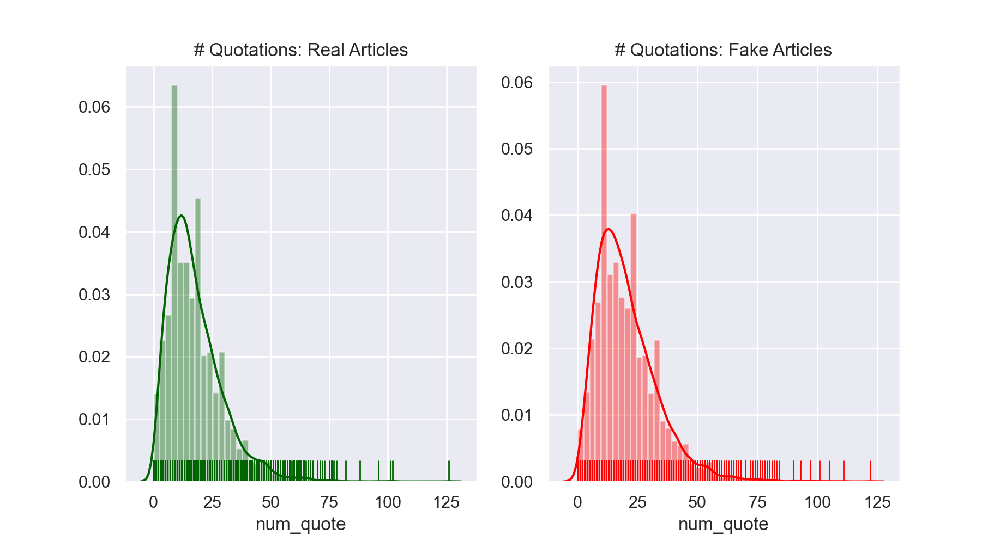

In [217]:
# plot quotations real/fake
fnid["num_quote"] = fnid["fullText_based_content"].str.count("\"")
quote_counts = fnid.groupby(['label_fnn'])[['num_quote']].sum().reset_index()

fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(fnid[fnid['label_fnn']=='real']['num_quote'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("# Quotations: Real Articles")
sns.distplot(fnid[fnid['label_fnn']=='fake']['num_quote'],
             ax = ax[1], color = "red", rug = True).set_title("# Quotations: Fake Articles");

In [308]:
fnid["num_quote_single"] = fnid["fullText_based_content"].str.count("\'")
fnid.groupby(['label_fnn'])[['num_quote_single']].mean()

,num_quote_single
label_fnn,
fake,4.699427
real,4.659519


#### Load tokens

In [164]:
# do for true and false news - load from earlier files created in part 1  
with open("true_token.txt", "rb") as fp:   
    true_token = pickle.load(fp)
    
with open("false_token.txt", "rb") as fp:   
    false_token = pickle.load(fp)

#### N-gram analysis
Load bigram files

In [110]:
# top n-grams - kind of slow
def top_ngram(data, n=2, top=20):
    vector = CountVectorizer(ngram_range=(n, n)).fit(data)
    bow = vector.transform(data)
    sum_words = bow.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) 
                  for word, idx in vector.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:top]

In [109]:
# plot n grams
def plot_ngram(ngram_list, text1, text2):
    ngram_df = ngram_list.to_frame().reset_index()
    ngram_df.columns = ['idx', 'count']
    tup_string = lambda x: ' '.join(x['idx'])
    ngram_df['words'] = ngram_df.apply(tup_string, axis=1)
    
    ax=sns.barplot(x='count',y='words', data=ngram_df)
    ax.set_title('Top 20 {}s - {} Text'.format(text1, text2),fontsize=10)
    ax.yaxis.set_tick_params(labelsize=8)
    ax.set_xlabel('Count', fontsize=8)
    ax.set_ylabel(text1 ,fontsize=8)

    for p in ax.patches:
        ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8);

In [268]:
bi_true = pd.Series(ngrams(true_token, 2)).value_counts()[:20]
bi_fake = pd.Series(ngrams(false_token, 2)).value_counts()[:20]

In [224]:
# load bigrams saves in part 1 - alternative to above cell
with open("bi_true.txt", "rb") as fp:   
    bi_true = pickle.load(fp)
    
with open("bi_fake.txt", "rb") as fp:   
    bi_fake = pickle.load(fp)

#### Changes over Time

<IPython.core.display.Javascript object>


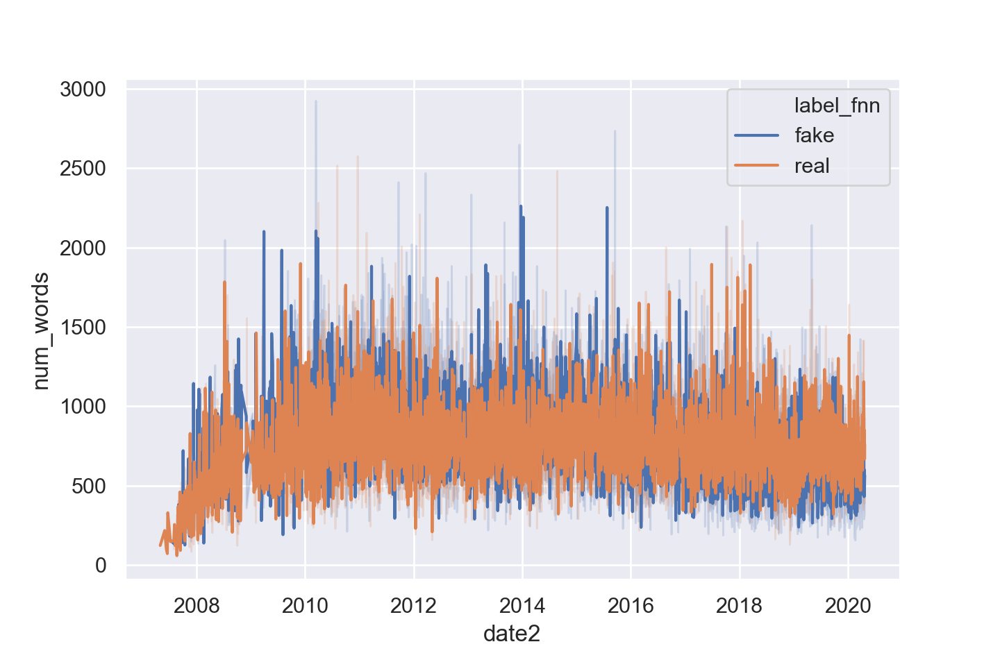

/Users/suryamenon/miniconda3/lib/python3.7/site-packages/pandas/plotting/_converter.py:129: FutureWarning:

Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()

Exception ignored in: <function SeekableUnicodeStreamReader.__del__ at 0x7f94c5684950>
Traceback (most recent call last):
  File "/Users/suryamenon/miniconda3/lib/python3.7/site-packages/nltk/data.py", line 1282, in __del__
    if not self.closed:
  File "/Users/suryamenon/miniconda3/lib/python3.7/site-packages/nltk/data.py", line 1296, in closed
    return self.stream.closed
AttributeError: 'SeekableUnicodeStreamReader' object has no attribute 'stream'


In [66]:
sns.lineplot(data=fnid, x='date2', y='num_words', hue='label_fnn');

<IPython.core.display.Javascript object>


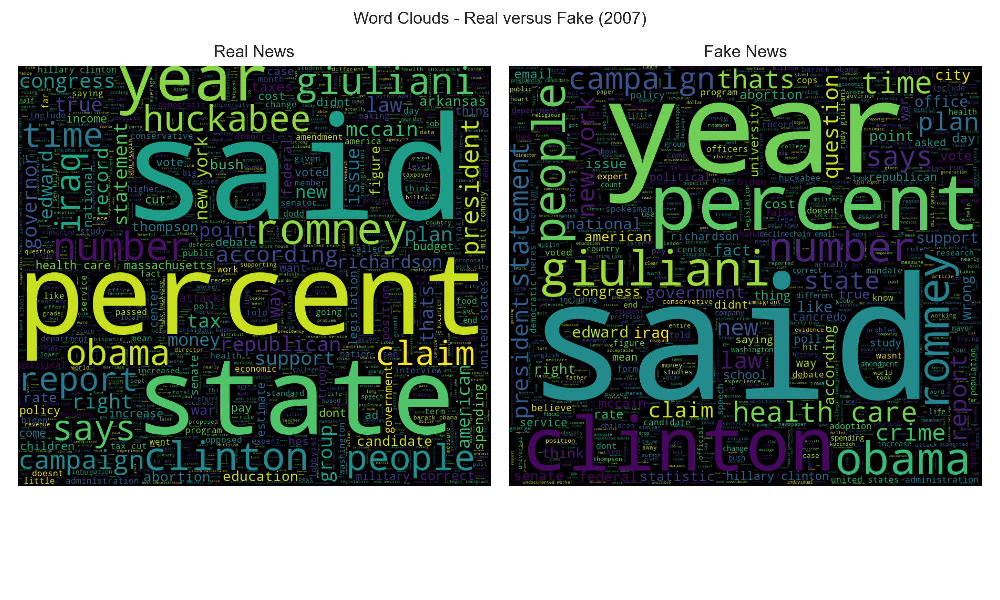

In [284]:
# look at word counts -  2007
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
wc_real_2007 = WordCloud(max_words = 2000 , width = 900 , height = 800 , 
                    stopwords = gensim_stop).generate(" ".join(fnid[(fnid['label_fnn']=='real') & (fnid['year']==2007)]['clean_text']))
ax[0].imshow(wc_real_2007 , interpolation = 'bilinear')
ax[0].set_title('Real News')
ax[0].axis('off')
wc_fake_2007 = WordCloud(max_words = 2000 , width = 900 , height = 800 , 
                    stopwords = gensim_stop).generate(" ".join(fnid[(fnid['label_fnn']=='fake') & (fnid['year']==2007)]['clean_text']))
ax[1].imshow(wc_fake_2007 , interpolation = 'bilinear')
ax[1].set_title('Fake News')
ax[1].axis('off')
fig.suptitle('Word Clouds - Real versus Fake (2007)', fontsize=12)
fig.tight_layout()
fig.subplots_adjust(top=1.05);

<IPython.core.display.Javascript object>


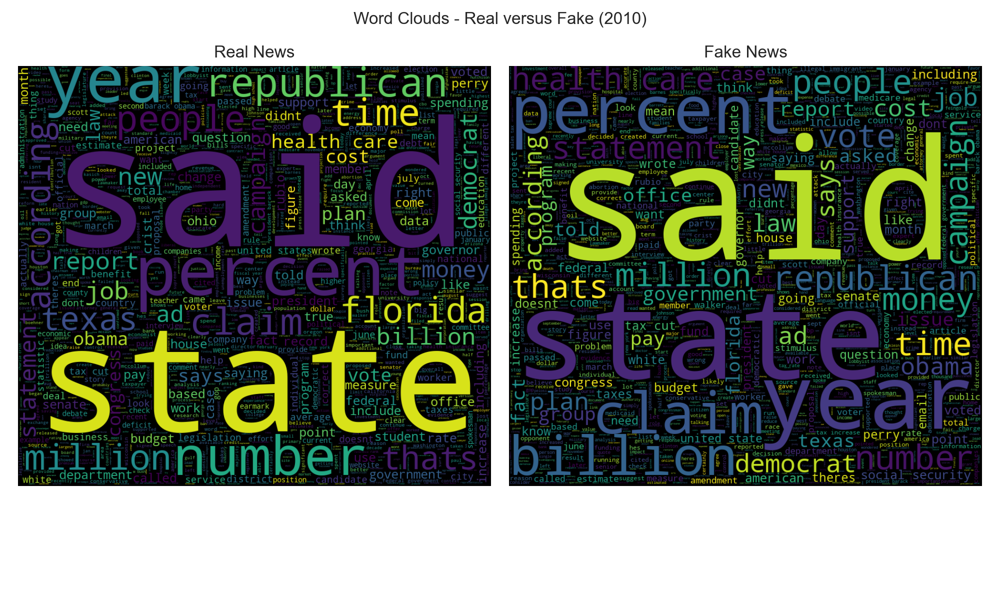

In [281]:
# look at word counts -  2010
fig, ax = plt.subplots(1, 2, figsize=(10, 6)) 
ax[0].imshow(wc_real_2010 , interpolation = 'bilinear')
ax[0].set_title('Real News')
ax[0].axis('off')
ax[1].imshow(wc_fake_2010 , interpolation = 'bilinear')
ax[1].set_title('Fake News')
ax[1].axis('off')
fig.suptitle('Word Clouds - Real versus Fake (2010)', fontsize=12)
fig.tight_layout()
fig.subplots_adjust(top=1.05);

<IPython.core.display.Javascript object>


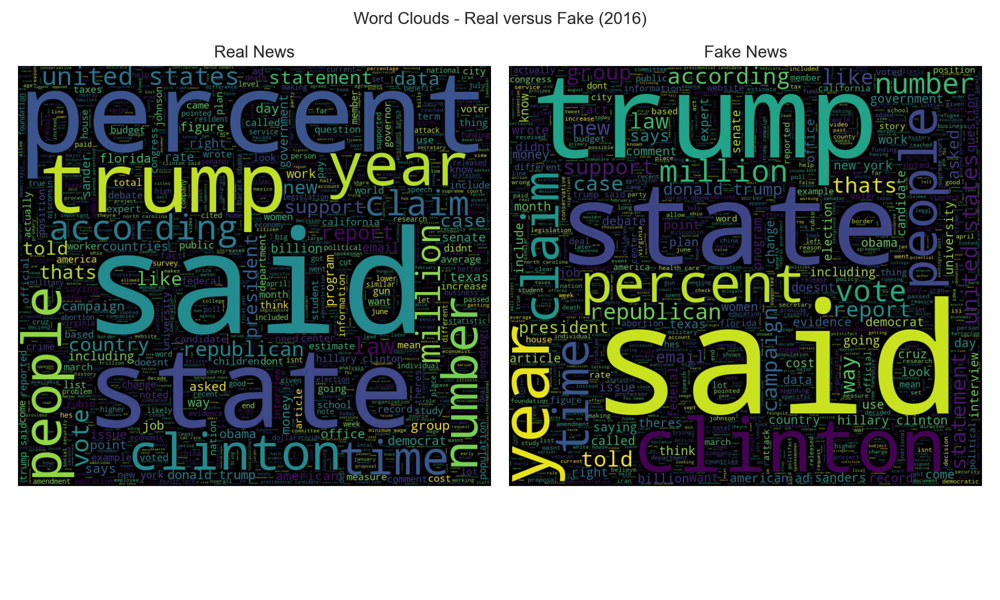

In [282]:
# look at word counts -  2016 - election year
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
wc_real_2016 = WordCloud(max_words = 2000 , width = 900 , height = 800 , 
                    stopwords = gensim_stop).generate(" ".join(fnid[(fnid['label_fnn']=='real') & (fnid['year']==2016)]['clean_text']))
ax[0].imshow(wc_real_2016 , interpolation = 'bilinear')
ax[0].set_title('Real News')
ax[0].axis('off')
wc_fake_2016 = WordCloud(max_words = 2000 , width = 900 , height = 800 , 
                    stopwords = gensim_stop).generate(" ".join(fnid[(fnid['label_fnn']=='fake') & (fnid['year']==2016)]['clean_text']))
ax[1].imshow(wc_fake_2016 , interpolation = 'bilinear')
ax[1].set_title('Fake News')
ax[1].axis('off')
fig.suptitle('Word Clouds - Real versus Fake (2016)', fontsize=12)
fig.tight_layout()
fig.subplots_adjust(top=1.05);

<IPython.core.display.Javascript object>


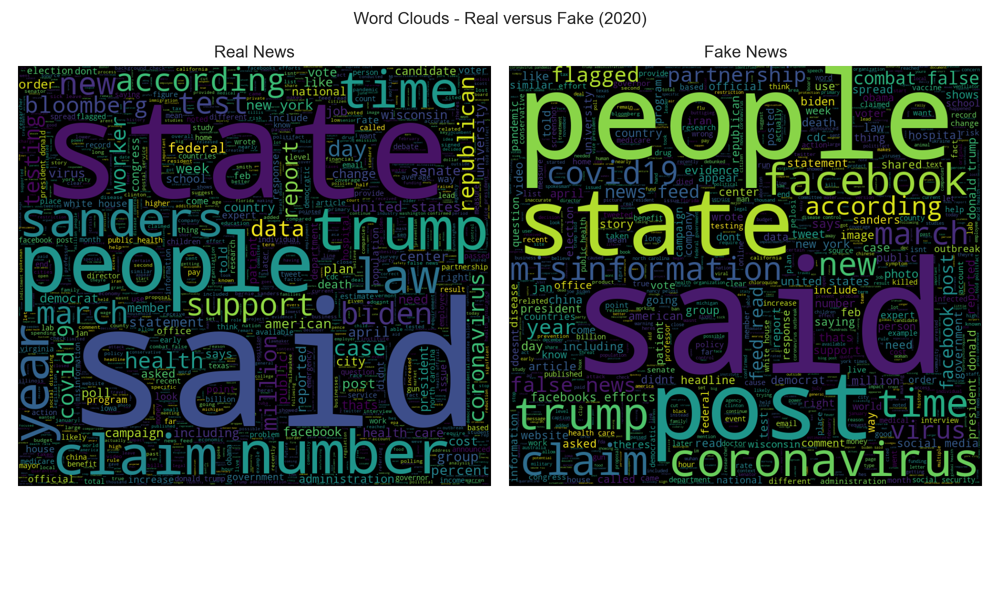

In [283]:
# look at word counts - 2020
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
wc_real_2020 = WordCloud(max_words = 2000 , width = 900 , height = 800 , 
                    stopwords = gensim_stop).generate(" ".join(fnid[(fnid['label_fnn']=='real') & (fnid['year']==2020)]['clean_text']))
ax[0].imshow(wc_real_2020 , interpolation = 'bilinear')
ax[0].set_title('Real News')
ax[0].axis('off')
wc_fake_2020 = WordCloud(max_words = 2000 , width = 900 , height = 800 , 
                    stopwords = gensim_stop).generate(" ".join(fnid[(fnid['label_fnn']=='fake') & (fnid['year']==2020)]['clean_text']))
ax[1].imshow(wc_fake_2020 , interpolation = 'bilinear')
ax[1].set_title('Fake News')
ax[1].axis('off')
fig.suptitle('Word Clouds - Real versus Fake (2020)', fontsize=12)
fig.tight_layout()
fig.subplots_adjust(top=1.05);

<IPython.core.display.Javascript object>


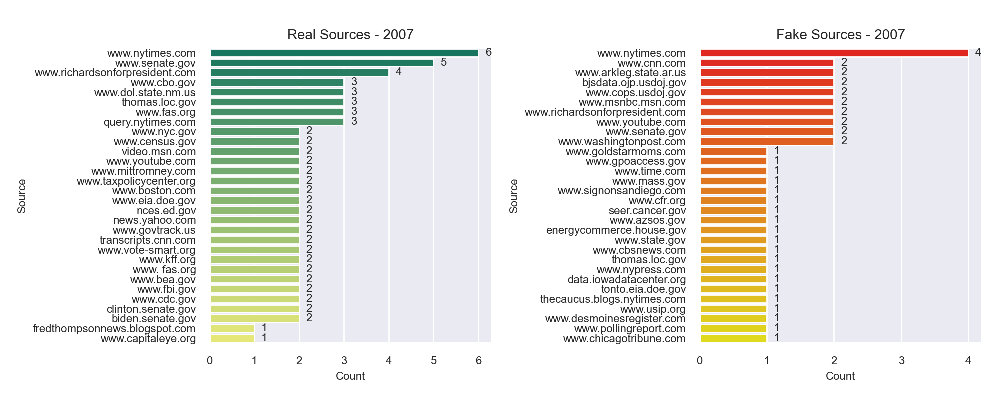

In [289]:
# real versus new sources - 2007
real_source_2007 = fnid[(fnid['label_fnn']=='real') & (fnid['source2']!='') & (fnid['year']==2007)]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index
fake_source_2007 = fnid[(fnid['label_fnn']=='fake') & (fnid['source2']!='') & (fnid['year']==2007)]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index

fig, ax = plt.subplots(1, 2, figsize=(10, 4))
sns.countplot(data=fnid[(fnid['label_fnn']=='real') & (fnid['source2']!='') & (fnid['year']==2007)], y='source2', 
              order=real_source_2007, palette='summer',  ax = ax[0]).set_title("Real Sources - 2007", fontsize=10)
sns.countplot(data=fnid[(fnid['label_fnn']=='fake') & (fnid['source2']!='') & (fnid['year']==2007)], y='source2', 
              order=fake_source_2007,palette='autumn',  ax = ax[1]).set_title("Fake Sources - 2007", fontsize=10)
ax[0].yaxis.set_tick_params(labelsize=8)
ax[0].xaxis.set_tick_params(labelsize=8)
ax[0].set_xlabel('Count', fontsize=8)
ax[0].set_ylabel('Source',fontsize=8)
ax[1].yaxis.set_tick_params(labelsize=8)
ax[1].xaxis.set_tick_params(labelsize=8)
ax[1].set_xlabel('Count', fontsize=8)
ax[1].set_ylabel('Source',fontsize=8)
fig.tight_layout()

for p in ax[0].patches:
    ax[0].annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8)
    
for p in ax[1].patches:
    ax[1].annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8)

fig.tight_layout()
fig.subplots_adjust(top=0.88);

<IPython.core.display.Javascript object>


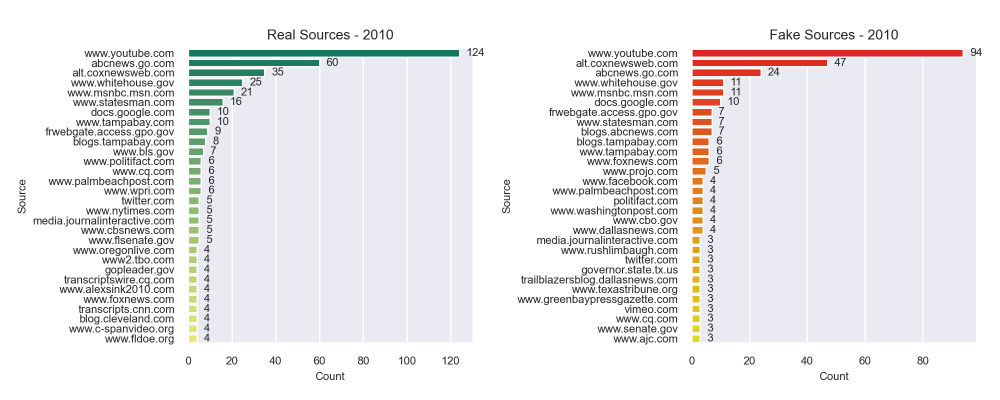

In [290]:
# real versus new sources - 2010
real_source_2010 = fnid[(fnid['label_fnn']=='real') & (fnid['source2']!='') & (fnid['year']==2010)]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index
fake_source_2010 = fnid[(fnid['label_fnn']=='fake') & (fnid['source2']!='') & (fnid['year']==2010)]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index

fig, ax = plt.subplots(1, 2, figsize=(10, 4))
sns.countplot(data=fnid[(fnid['label_fnn']=='real') & (fnid['source2']!='') & (fnid['year']==2010)], y='source2', 
              order=real_source_2010, palette='summer',  ax = ax[0]).set_title("Real Sources - 2010", fontsize=10)
sns.countplot(data=fnid[(fnid['label_fnn']=='fake') & (fnid['source2']!='') & (fnid['year']==2010)], y='source2', 
              order=fake_source_2010,palette='autumn',  ax = ax[1]).set_title("Fake Sources - 2010", fontsize=10)
ax[0].yaxis.set_tick_params(labelsize=8)
ax[0].xaxis.set_tick_params(labelsize=8)
ax[0].set_xlabel('Count', fontsize=8)
ax[0].set_ylabel('Source',fontsize=8)
ax[1].yaxis.set_tick_params(labelsize=8)
ax[1].xaxis.set_tick_params(labelsize=8)
ax[1].set_xlabel('Count', fontsize=8)
ax[1].set_ylabel('Source',fontsize=8)
fig.tight_layout()

for p in ax[0].patches:
    ax[0].annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8)
    
for p in ax[1].patches:
    ax[1].annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8)

fig.tight_layout()
fig.subplots_adjust(top=0.88);

<IPython.core.display.Javascript object>


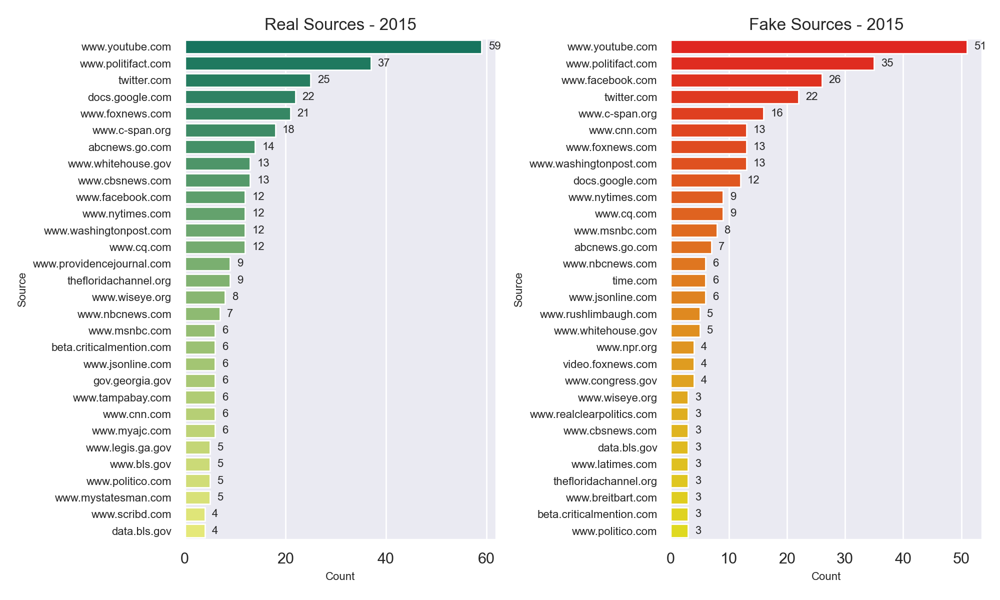

In [83]:
# real versus new sources - 2015
real_source_2015 = fnid[(fnid['label_fnn']=='real') & (fnid['source2']!='') & (fnid['year']==2015)]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index
fake_source_2015 = fnid[(fnid['label_fnn']=='fake') & (fnid['source2']!='') & (fnid['year']==2015)]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index

fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.countplot(data=fnid[(fnid['label_fnn']=='real') & (fnid['source2']!='') & (fnid['year']==2015)], y='source2', 
              order=real_source_2015, palette='summer',  ax = ax[0]).set_title("Real Sources - 2015")
sns.countplot(data=fnid[(fnid['label_fnn']=='fake') & (fnid['source2']!='') & (fnid['year']==2015)], y='source2', 
              order=fake_source_2015,palette='autumn',  ax = ax[1]).set_title("Fake Sources - 2015")
ax[0].yaxis.set_tick_params(labelsize=8)
ax[0].set_xlabel('Count', fontsize=8)
ax[0].set_ylabel('Source',fontsize=8)
ax[1].yaxis.set_tick_params(labelsize=8)
ax[1].set_xlabel('Count', fontsize=8)
ax[1].set_ylabel('Source',fontsize=8)
fig.tight_layout()

for p in ax[0].patches:
    ax[0].annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8)
    
for p in ax[1].patches:
    ax[1].annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8);

<IPython.core.display.Javascript object>


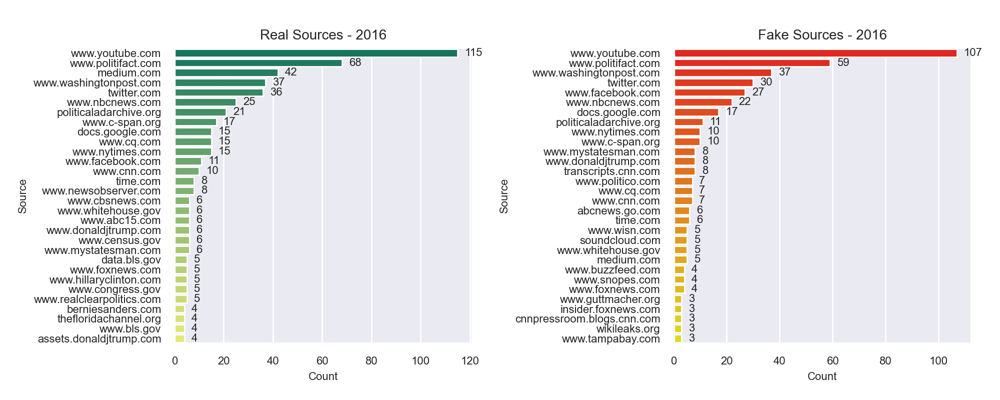

In [291]:
# real versus new sources - 2016
real_source_2016 = fnid[(fnid['label_fnn']=='real') & (fnid['source2']!='') & (fnid['year']==2016)]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index
fake_source_2016 = fnid[(fnid['label_fnn']=='fake') & (fnid['source2']!='') & (fnid['year']==2016)]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index

fig, ax = plt.subplots(1, 2, figsize=(10, 4))
sns.countplot(data=fnid[(fnid['label_fnn']=='real') & (fnid['source2']!='') & (fnid['year']==2016)], y='source2', 
              order=real_source_2016, palette='summer',  ax = ax[0]).set_title("Real Sources - 2016", fontsize=10)
sns.countplot(data=fnid[(fnid['label_fnn']=='fake') & (fnid['source2']!='') & (fnid['year']==2016)], y='source2', 
              order=fake_source_2016,palette='autumn',  ax = ax[1]).set_title("Fake Sources - 2016", fontsize=10)
ax[0].yaxis.set_tick_params(labelsize=8)
ax[0].xaxis.set_tick_params(labelsize=8)
ax[0].set_xlabel('Count', fontsize=8)
ax[0].set_ylabel('Source',fontsize=8)
ax[1].yaxis.set_tick_params(labelsize=8)
ax[1].xaxis.set_tick_params(labelsize=8)
ax[1].set_xlabel('Count', fontsize=8)
ax[1].set_ylabel('Source',fontsize=8)
fig.tight_layout()

for p in ax[0].patches:
    ax[0].annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8)
    
for p in ax[1].patches:
    ax[1].annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8)

fig.tight_layout()
fig.subplots_adjust(top=0.88);

<IPython.core.display.Javascript object>


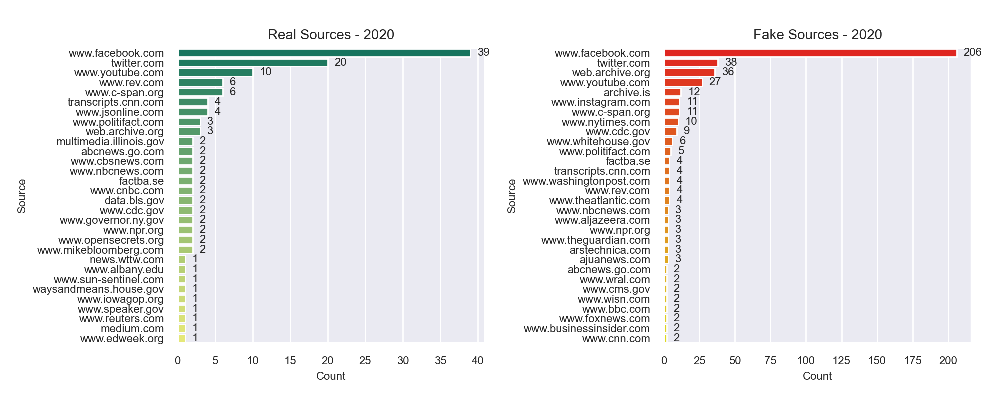

In [292]:
# real versus new sources - 2020
real_source_2020 = fnid[(fnid['label_fnn']=='real') & (fnid['source2']!='') & (fnid['year']==2020)]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index
fake_source_2020 = fnid[(fnid['label_fnn']=='fake') & (fnid['source2']!='') & (fnid['year']==2020)]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index

fig, ax = plt.subplots(1, 2, figsize=(10, 4))
sns.countplot(data=fnid[(fnid['label_fnn']=='real') & (fnid['source2']!='') & (fnid['year']==2020)], y='source2', 
              order=real_source_2020, palette='summer',  ax = ax[0]).set_title("Real Sources - 2020", fontsize=10)
sns.countplot(data=fnid[(fnid['label_fnn']=='fake') & (fnid['source2']!='') & (fnid['year']==2020)], y='source2', 
              order=fake_source_2020,palette='autumn',  ax = ax[1]).set_title("Fake Sources - 2020", fontsize=10)
ax[0].yaxis.set_tick_params(labelsize=8)
ax[0].xaxis.set_tick_params(labelsize=8)
ax[0].set_xlabel('Count', fontsize=8)
ax[0].set_ylabel('Source',fontsize=8)
ax[1].yaxis.set_tick_params(labelsize=8)
ax[1].xaxis.set_tick_params(labelsize=8)
ax[1].set_xlabel('Count', fontsize=8)
ax[1].set_ylabel('Source',fontsize=8)
fig.tight_layout()

for p in ax[0].patches:
    ax[0].annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8)
    
for p in ax[1].patches:
    ax[1].annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8)

fig.tight_layout()
fig.subplots_adjust(top=0.88);

<IPython.core.display.Javascript object>


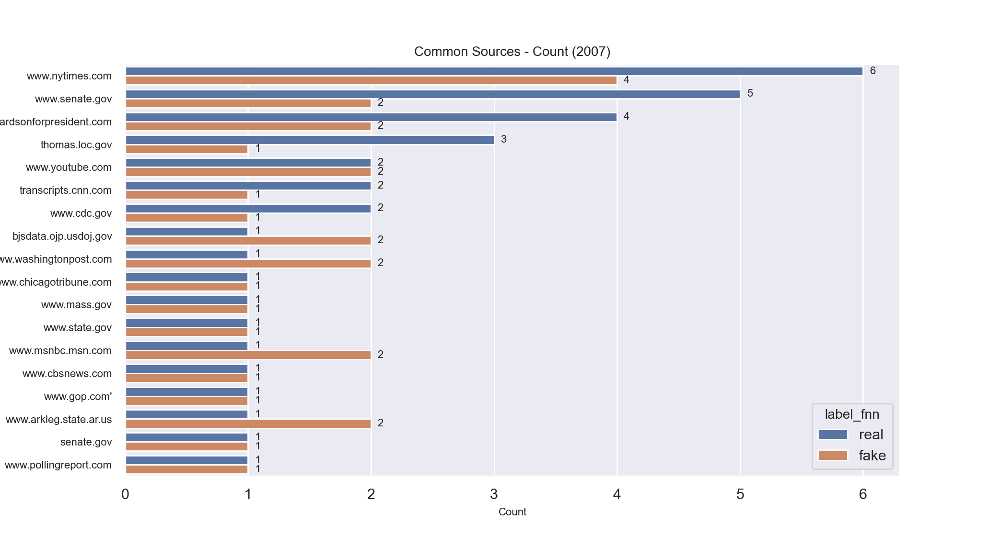

In [100]:
# plot common sources - 2007
common_source_2007 = list(set(fnid[(fnid['label_fnn']=='fake') & (fnid['source2']!='') & (fnid['year']==2007)]['source2']).intersection(set(fnid[(fnid['label_fnn']=='real') & (fnid['source2']!='') & (fnid['year']==2007)]['source2'])))
common_order_2007=fnid[(fnid['label_fnn']=='real') & (fnid['source2'].isin(common_source_2007)) & (fnid['year']==2007)]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index
ax=sns.countplot(data=fnid[(fnid['source2'].isin(common_source_2007)) & (fnid['year']==2007)], 
                 y='source2', hue="label_fnn",
              order=common_order_2007)
ax.set_title('Common Sources - Count (2007)',fontsize=10)
ax.yaxis.set_tick_params(labelsize=8)
ax.set_xlabel('Count', fontsize=8)
ax.set_ylabel('Source',fontsize=8)

for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8);

<IPython.core.display.Javascript object>


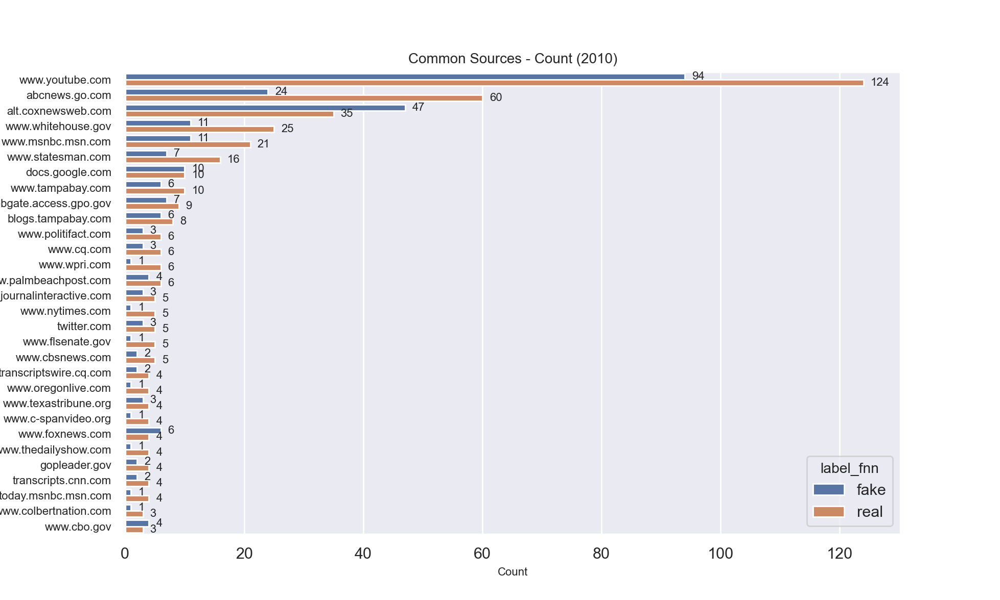

In [101]:
# plot common sources - 2010
common_source_2010 = list(set(fnid[(fnid['label_fnn']=='fake') & (fnid['source2']!='') & (fnid['year']==2010)]['source2']).intersection(set(fnid[(fnid['label_fnn']=='real') & (fnid['source2']!='') & (fnid['year']==2010)]['source2'])))
common_order_2010=fnid[(fnid['label_fnn']=='real') & (fnid['source2'].isin(common_source_2010)) & (fnid['year']==2010)]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index
ax=sns.countplot(data=fnid[(fnid['source2'].isin(common_source_2010)) & (fnid['year']==2010)], 
                 y='source2', hue="label_fnn",
              order=common_order_2010)
ax.set_title('Common Sources - Count (2010)',fontsize=10)
ax.yaxis.set_tick_params(labelsize=8)
ax.set_xlabel('Count', fontsize=8)
ax.set_ylabel('Source',fontsize=8)

for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8);

<IPython.core.display.Javascript object>


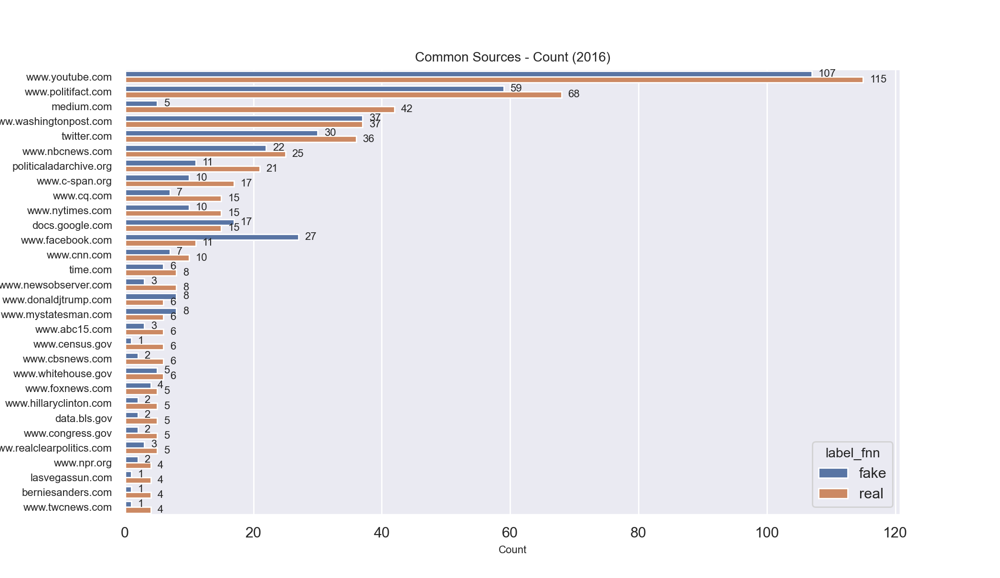

In [102]:
# plot common sources - 2016
common_source_2016 = list(set(fnid[(fnid['label_fnn']=='fake') & (fnid['source2']!='') & (fnid['year']==2016)]['source2']).intersection(set(fnid[(fnid['label_fnn']=='real') & (fnid['source2']!='') & (fnid['year']==2016)]['source2'])))
common_order_2016=fnid[(fnid['label_fnn']=='real') & (fnid['source2'].isin(common_source_2016)) & (fnid['year']==2016)]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index
ax=sns.countplot(data=fnid[(fnid['source2'].isin(common_source_2016)) & (fnid['year']==2016)], 
                 y='source2', hue="label_fnn",
              order=common_order_2016)
ax.set_title('Common Sources - Count (2016)',fontsize=10)
ax.yaxis.set_tick_params(labelsize=8)
ax.set_xlabel('Count', fontsize=8)
ax.set_ylabel('Source',fontsize=8)

for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8);

<IPython.core.display.Javascript object>


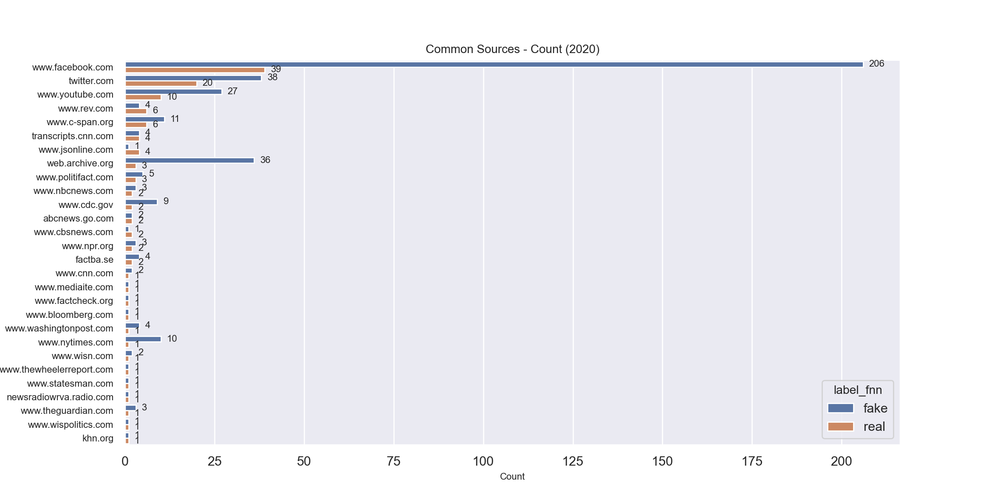

In [103]:
# plot common sources - 2020
common_source_2020 = list(set(fnid[(fnid['label_fnn']=='fake') & (fnid['source2']!='') & (fnid['year']==2020)]['source2']).intersection(set(fnid[(fnid['label_fnn']=='real') & (fnid['source2']!='') & (fnid['year']==2020)]['source2'])))
common_order_2020=fnid[(fnid['label_fnn']=='real') & (fnid['source2'].isin(common_source_2020)) & (fnid['year']==2020)]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index
ax=sns.countplot(data=fnid[(fnid['source2'].isin(common_source_2020)) & (fnid['year']==2020)], 
                 y='source2', hue="label_fnn",
              order=common_order_2020)
ax.set_title('Common Sources - Count (2020)',fontsize=10)
ax.yaxis.set_tick_params(labelsize=8)
ax.set_xlabel('Count', fontsize=8)
ax.set_ylabel('Source',fontsize=8)

for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8);

<IPython.core.display.Javascript object>


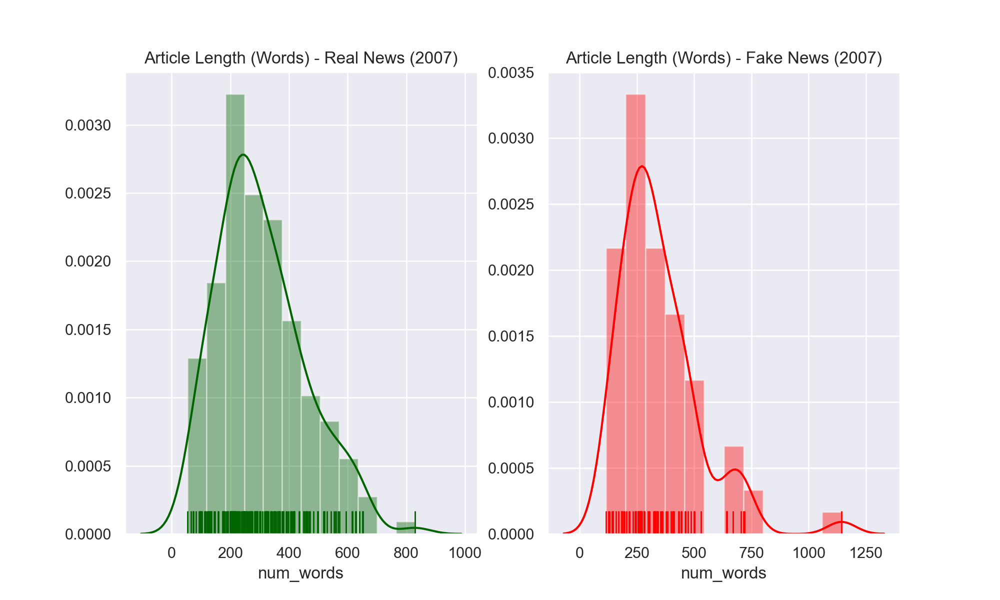

In [104]:
# distribution word counts - 2007
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(fnid[(fnid['label_fnn']=='real') & (fnid['year']==2007)]['num_words'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Article Length (Words) - Real News (2007)")
sns.distplot(fnid[(fnid['label_fnn']=='fake') & (fnid['year']==2007)]['num_words'],
             ax = ax[1], color = "red", rug = True).set_title("Article Length (Words) - Fake News (2007)");

<IPython.core.display.Javascript object>


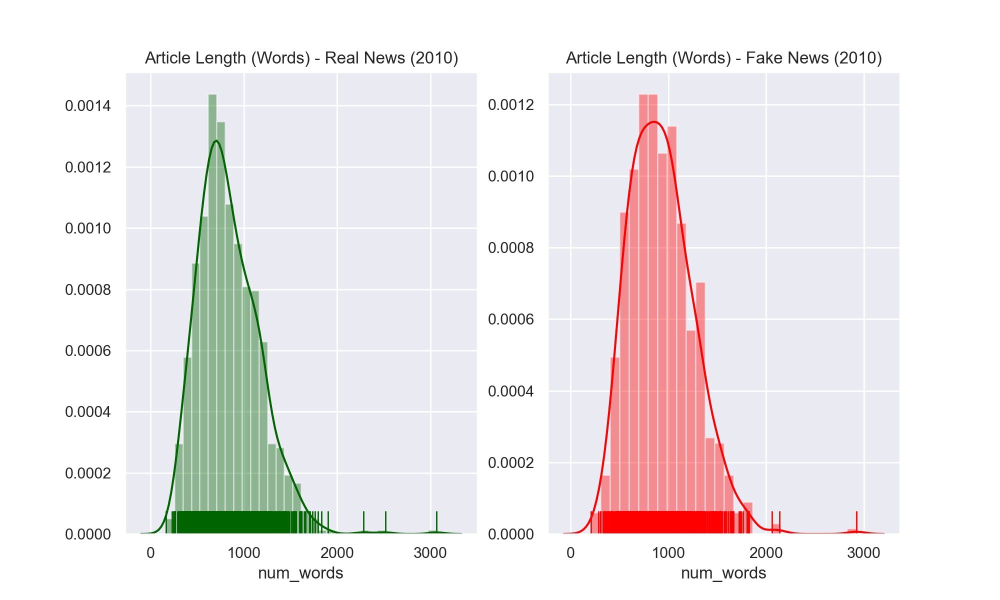

In [105]:
# distribution word counts - 2010
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(fnid[(fnid['label_fnn']=='real') & (fnid['year']==2010)]['num_words'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Article Length (Words) - Real News (2010)")
sns.distplot(fnid[(fnid['label_fnn']=='fake') & (fnid['year']==2010)]['num_words'],
             ax = ax[1], color = "red", rug = True).set_title("Article Length (Words) - Fake News (2010)");

<IPython.core.display.Javascript object>


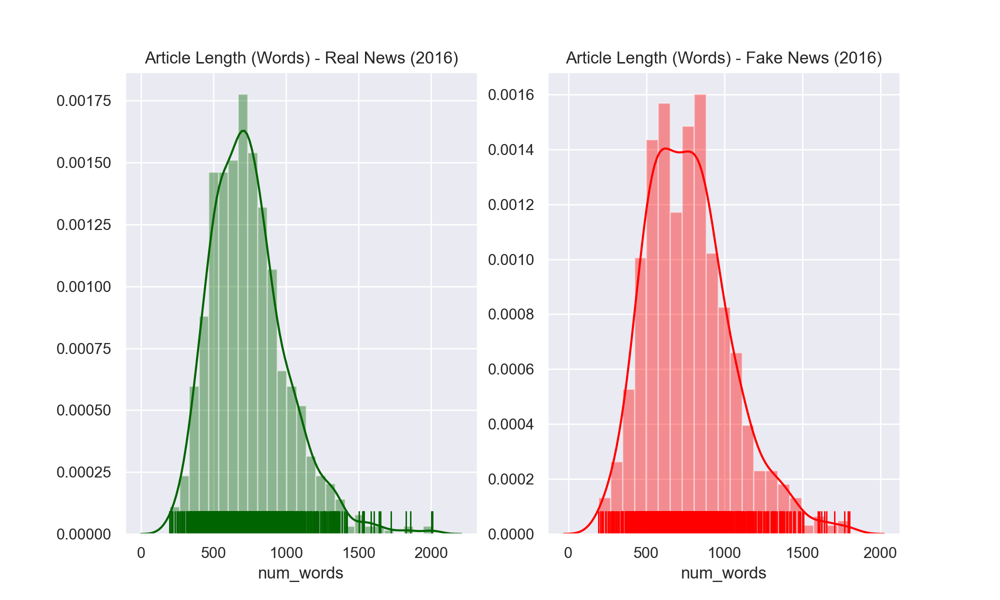

In [106]:
# distribution word counts - 2016
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(fnid[(fnid['label_fnn']=='real') & (fnid['year']==2016)]['num_words'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Article Length (Words) - Real News (2016)")
sns.distplot(fnid[(fnid['label_fnn']=='fake') & (fnid['year']==2016)]['num_words'],
             ax = ax[1], color = "red", rug = True).set_title("Article Length (Words) - Fake News (2016)");

<IPython.core.display.Javascript object>


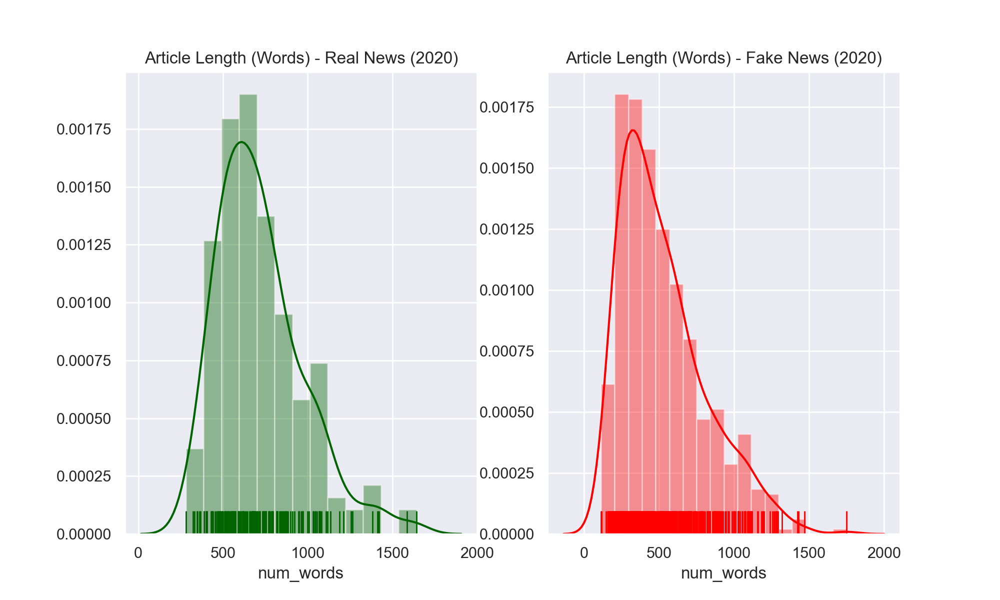

In [107]:
# distribution word counts - 2020
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(fnid[(fnid['label_fnn']=='real') & (fnid['year']==2020)]['num_words'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Article Length (Words) - Real News (2020)")
sns.distplot(fnid[(fnid['label_fnn']=='fake') & (fnid['year']==2020)]['num_words'],
             ax = ax[1], color = "red", rug = True).set_title("Article Length (Words) - Fake News (2020)");

In [126]:
# plot n grams
def plot_ngram_year(ngram_list, text1, text2, year):
    ngram_df = ngram_list.to_frame().reset_index()
    ngram_df.columns = ['idx', 'count']
    tup_string = lambda x: ' '.join(x['idx'])
    ngram_df['words'] = ngram_df.apply(tup_string, axis=1)
    
    ax=sns.barplot(x='count',y='words', data=ngram_df)
    ax.set_title('Top 20 {}s - {} Text - {}'.format(text1, text2, year),fontsize=10)
    ax.yaxis.set_tick_params(labelsize=8)
    ax.set_xlabel('Count', fontsize=8)
    ax.set_ylabel(text1 ,fontsize=8)

    for p in ax.patches:
        ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8);

<IPython.core.display.Javascript object>


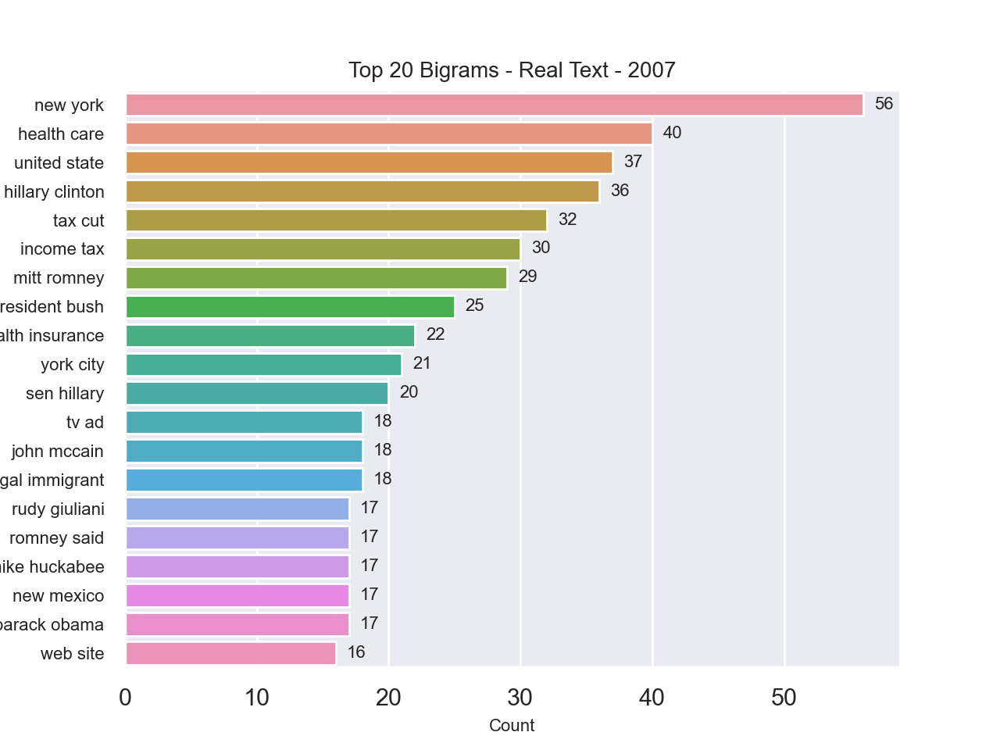

In [127]:
# bigrams - 2007 
true_2007 = token_text(fnid[(fnid['label_fnn']=='real') & (fnid['year']==2007)])
fake_2007 = token_text(fnid[(fnid['label_fnn']=='fake') & (fnid['year']==2007)])

bi_true_2007 = pd.Series(ngrams(true_2007, 2)).value_counts()[:20]
bi_fake_2007 = pd.Series(ngrams(fake_2007, 2)).value_counts()[:20]

plot_ngram_year(bi_true_2007, 'Bigram', 'Real', 2007)

<IPython.core.display.Javascript object>


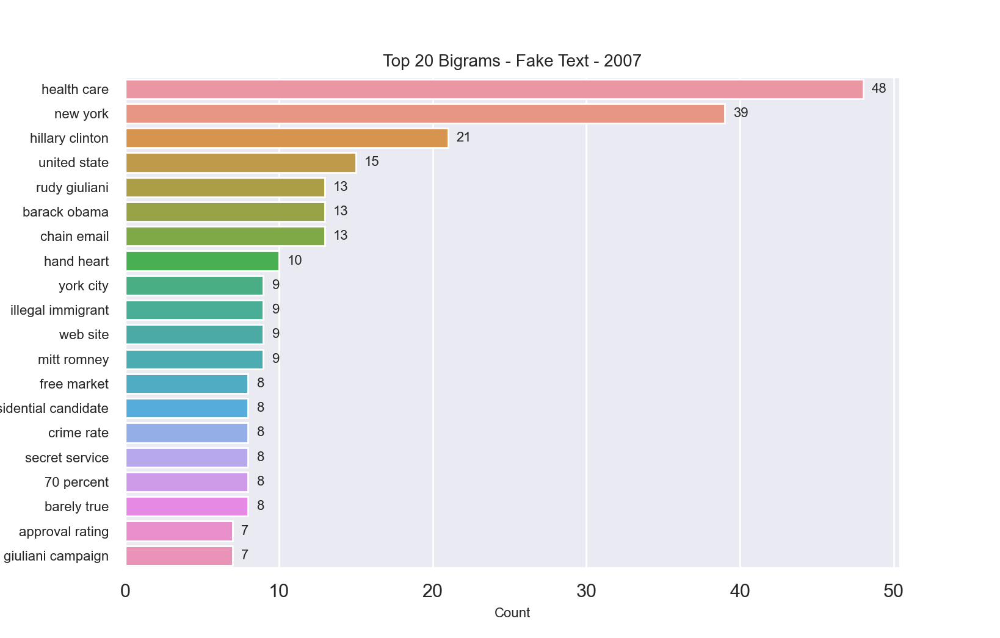

In [128]:
plot_ngram_year(bi_fake_2007, 'Bigram', 'Fake', 2007)

<IPython.core.display.Javascript object>


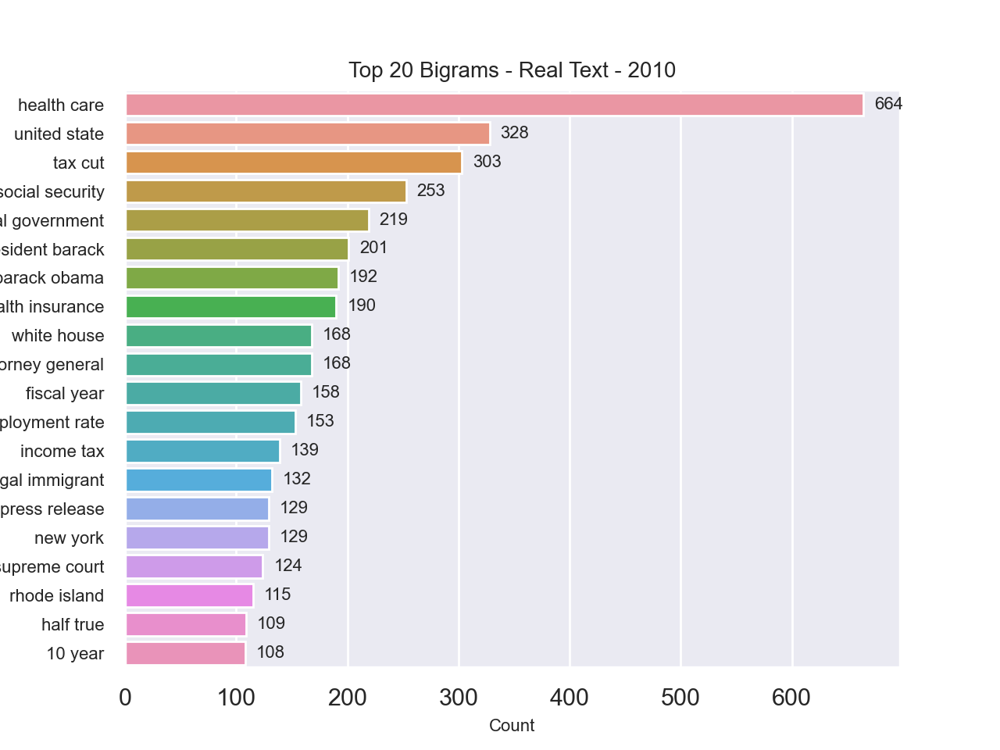

In [129]:
# bigrams - 2010
true_2010 = token_text(fnid[(fnid['label_fnn']=='real') & (fnid['year']==2010)])
fake_2010 = token_text(fnid[(fnid['label_fnn']=='fake') & (fnid['year']==2010)])

bi_true_2010 = pd.Series(ngrams(true_2010, 2)).value_counts()[:20]
bi_fake_2010 = pd.Series(ngrams(fake_2010, 2)).value_counts()[:20]

plot_ngram_year(bi_true_2010, 'Bigram', 'Real', 2010)

<IPython.core.display.Javascript object>


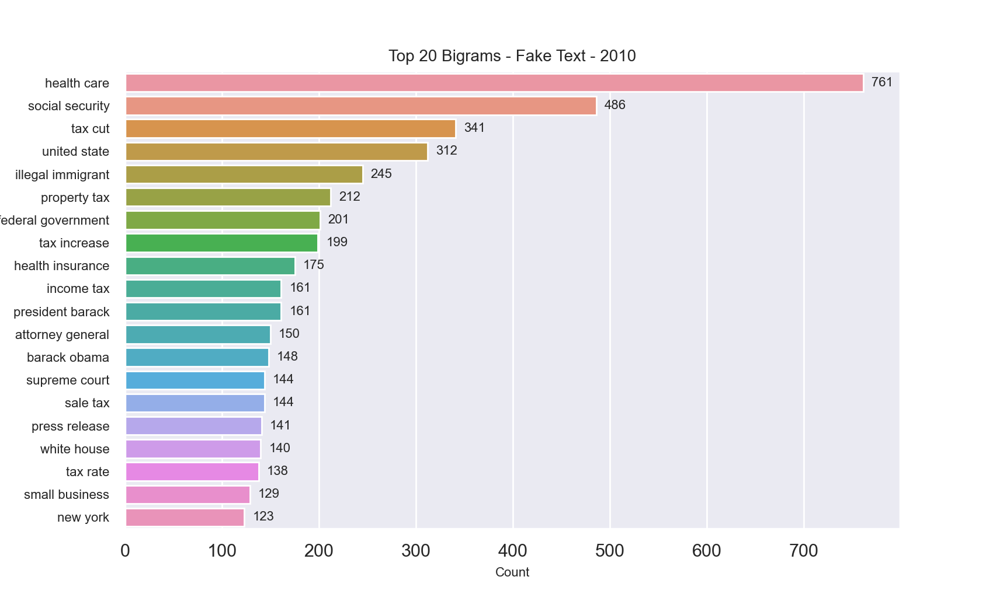

In [130]:
plot_ngram_year(bi_fake_2010, 'Bigram', 'Fake', 2010)

<IPython.core.display.Javascript object>


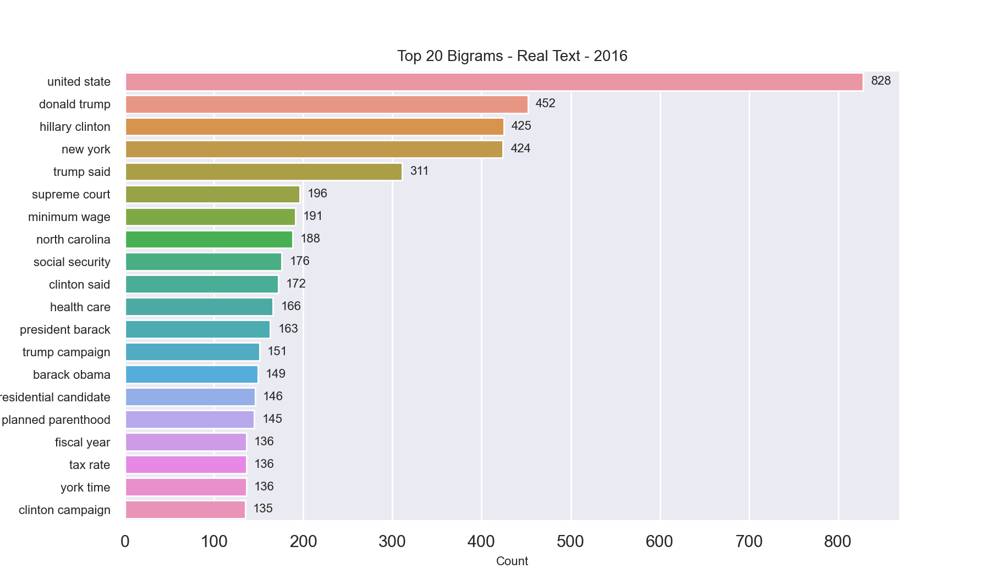

In [131]:
# bigrams - 2016
true_2016 = token_text(fnid[(fnid['label_fnn']=='real') & (fnid['year']==2016)])
fake_2016 = token_text(fnid[(fnid['label_fnn']=='fake') & (fnid['year']==2016)])

bi_true_2016 = pd.Series(ngrams(true_2016, 2)).value_counts()[:20]
bi_fake_2016 = pd.Series(ngrams(fake_2016, 2)).value_counts()[:20]

plot_ngram_year(bi_true_2016, 'Bigram', 'Real', 2016)

<IPython.core.display.Javascript object>


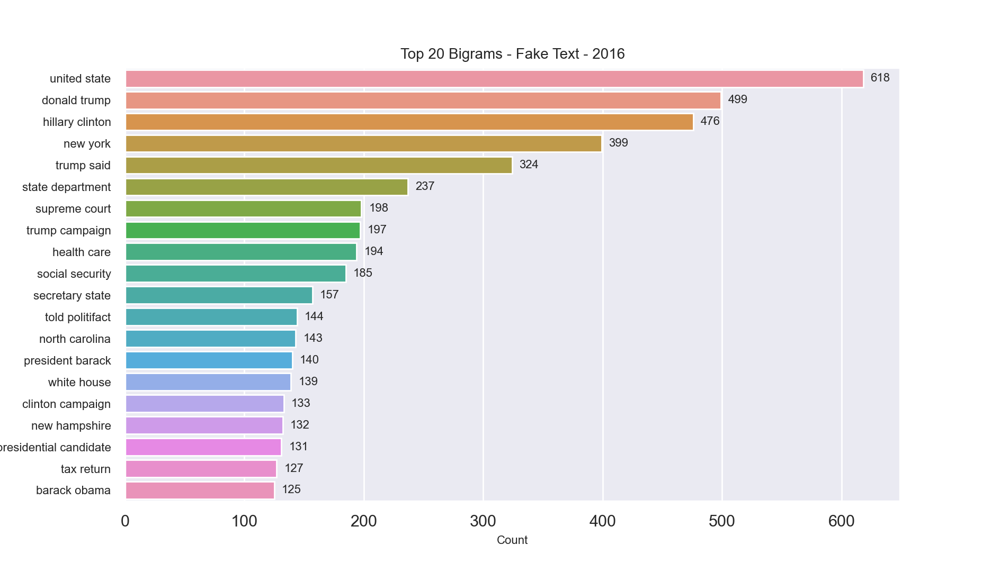

In [132]:
plot_ngram_year(bi_fake_2016, 'Bigram', 'Fake', 2016)

<IPython.core.display.Javascript object>


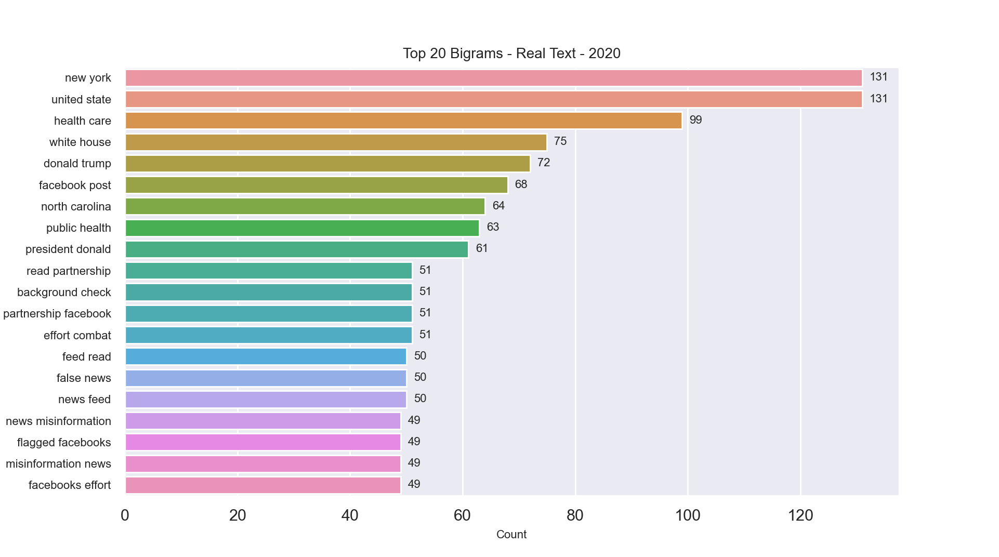

In [133]:
# bigrams -  2020
true_2020 = token_text(fnid[(fnid['label_fnn']=='real') & (fnid['year']==2020)])
fake_2020 = token_text(fnid[(fnid['label_fnn']=='fake') & (fnid['year']==2020)])

bi_true_2020 = pd.Series(ngrams(true_2020, 2)).value_counts()[:20]
bi_fake_2020 = pd.Series(ngrams(fake_2020, 2)).value_counts()[:20]

plot_ngram_year(bi_true_2020, 'Bigram', 'Real', 2020)

<IPython.core.display.Javascript object>


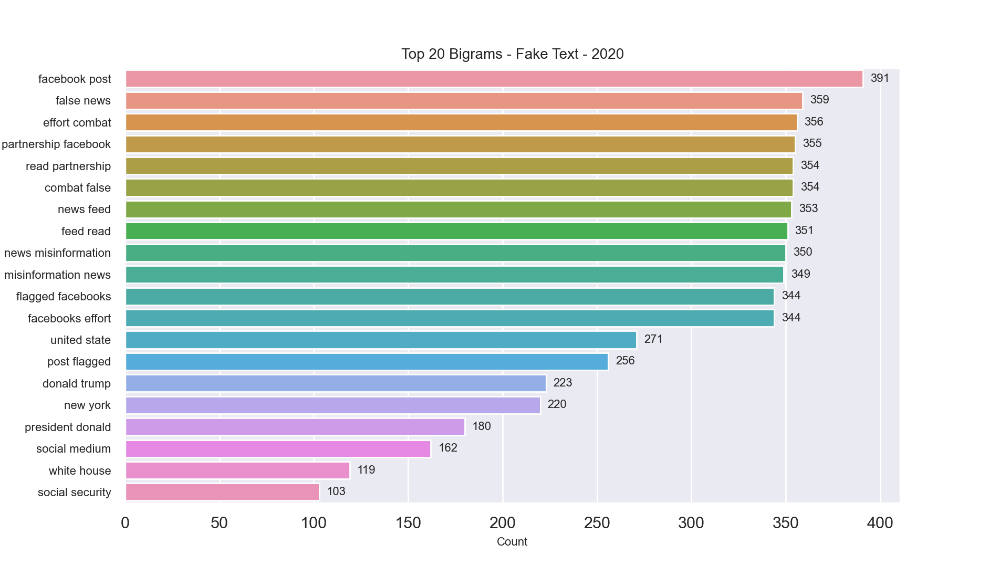

In [134]:
plot_ngram_year(bi_fake_2020, 'Bigram', 'Fake', 2020)

In [52]:
# sentiment over time
sentiment_year = fnid.groupby(['label_fnn', 'year'])[['pos', 'neg', 'compound', 'polarity']].mean().reset_index()
sentiment_year.head()

,label_fnn,year,pos,neg,compound,polarity
0,fake,2007,0.135171,0.104414,0.262114,0.044382
1,fake,2008,0.145829,0.101209,0.417356,0.057600
2,fake,2009,0.150046,0.089449,0.559347,0.051715
3,fake,2010,0.125258,0.090464,0.397313,0.051323
4,fake,2011,0.119409,0.093349,0.292079,0.049077


<IPython.core.display.Javascript object>


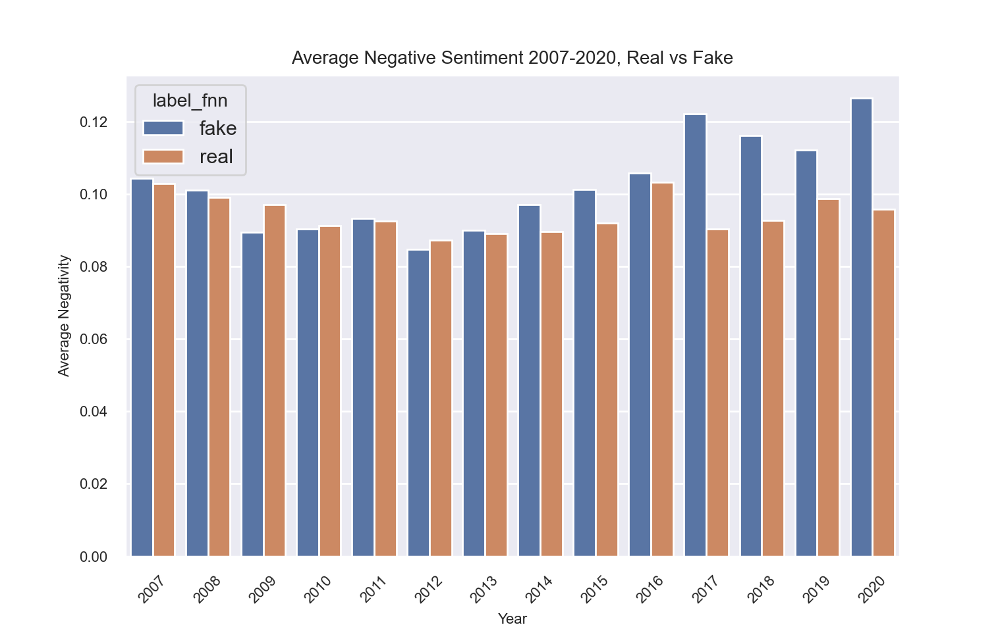

In [56]:
# average negativity by year
ax=sns.barplot(x='year',y='neg',hue='label_fnn', data=sentiment_year )
ax.set_title('Average Negative Sentiment 2007-2020, Real vs Fake',fontsize=10)
ax.yaxis.set_tick_params(labelsize=8)
ax.xaxis.set_tick_params(labelsize=8)
ax.set_xlabel('Year', fontsize=8)
ax.tick_params(axis='x', labelrotation=45)
ax.set_ylabel('Average Negativity',fontsize=8);

<IPython.core.display.Javascript object>


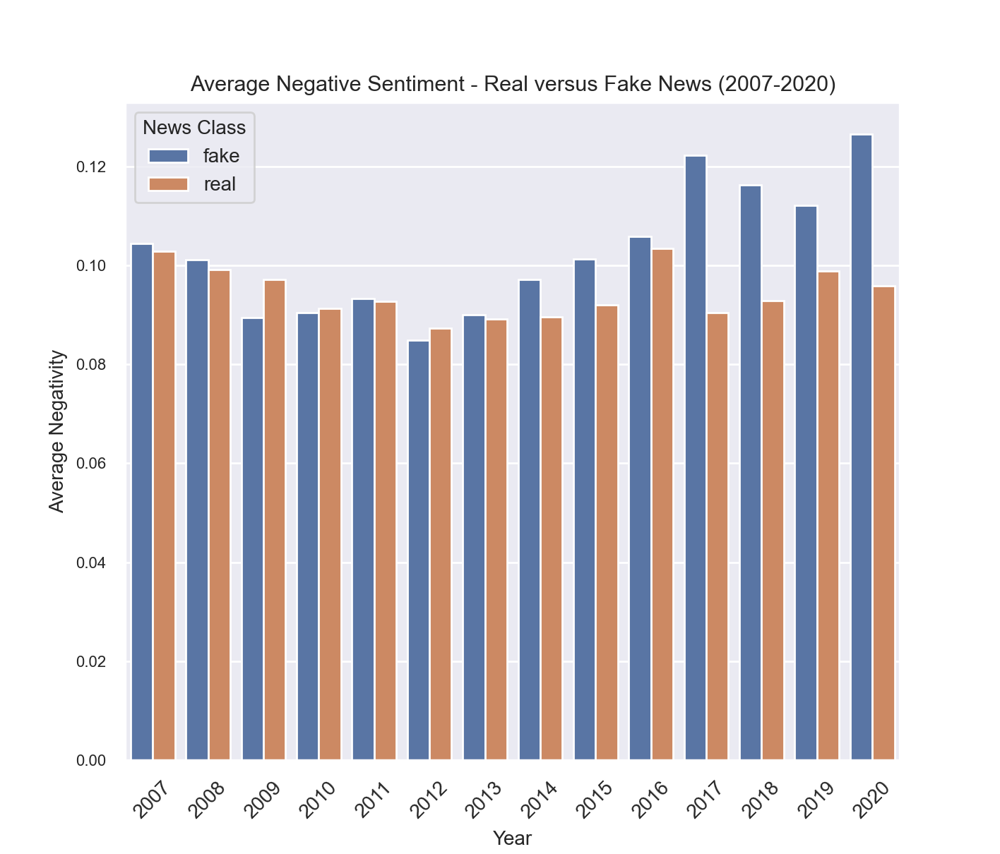

In [301]:
ax=sns.barplot(x='year',y='neg',hue='label_fnn', data=sentiment_year )
ax.set_title('Average Negative Sentiment - Real versus Fake News (2007-2020)',fontsize=11)
ax.yaxis.set_tick_params(labelsize=8)
ax.xaxis.set_tick_params(labelsize=10)
ax.legend(title='News Class', title_fontsize=10, prop=dict(size=10))
ax.set_xlabel('Year', fontsize=10)
ax.tick_params(axis='x', labelrotation=45)
ax.set_ylabel('Average Negativity',fontsize=10);

<IPython.core.display.Javascript object>


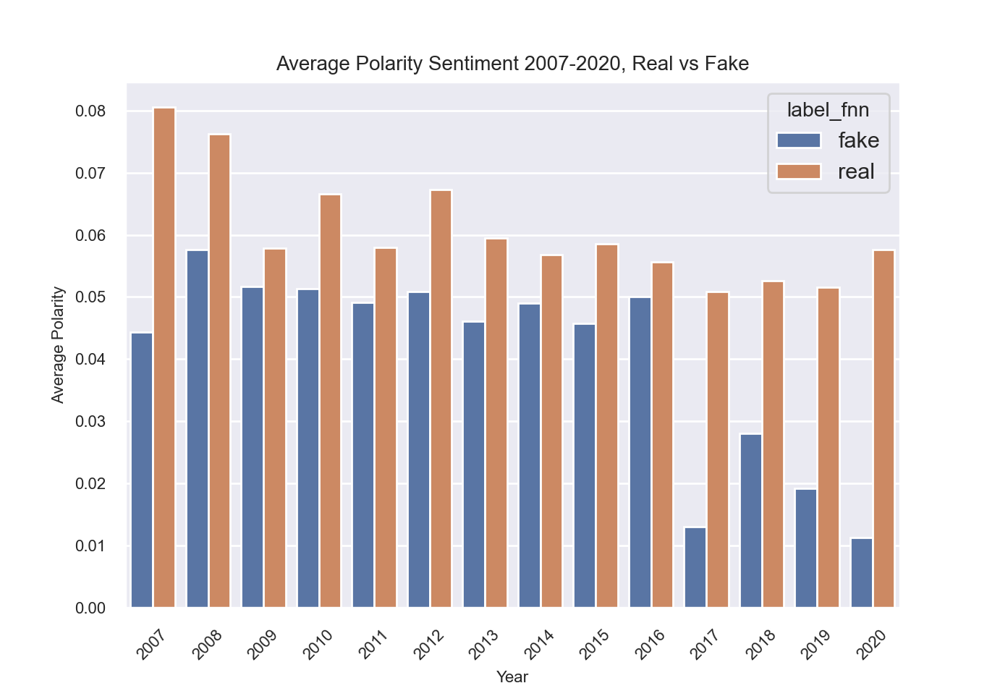

In [57]:
# average polarity by year - less is more negative
ax=sns.barplot(x='year',y='polarity',hue='label_fnn', data=sentiment_year )
ax.set_title('Average Polarity Sentiment 2007-2020, Real vs Fake',fontsize=10)
ax.yaxis.set_tick_params(labelsize=8)
ax.xaxis.set_tick_params(labelsize=8)
ax.set_xlabel('Year', fontsize=8)
ax.tick_params(axis='x', labelrotation=45)
ax.set_ylabel('Average Polarity',fontsize=8);

<IPython.core.display.Javascript object>


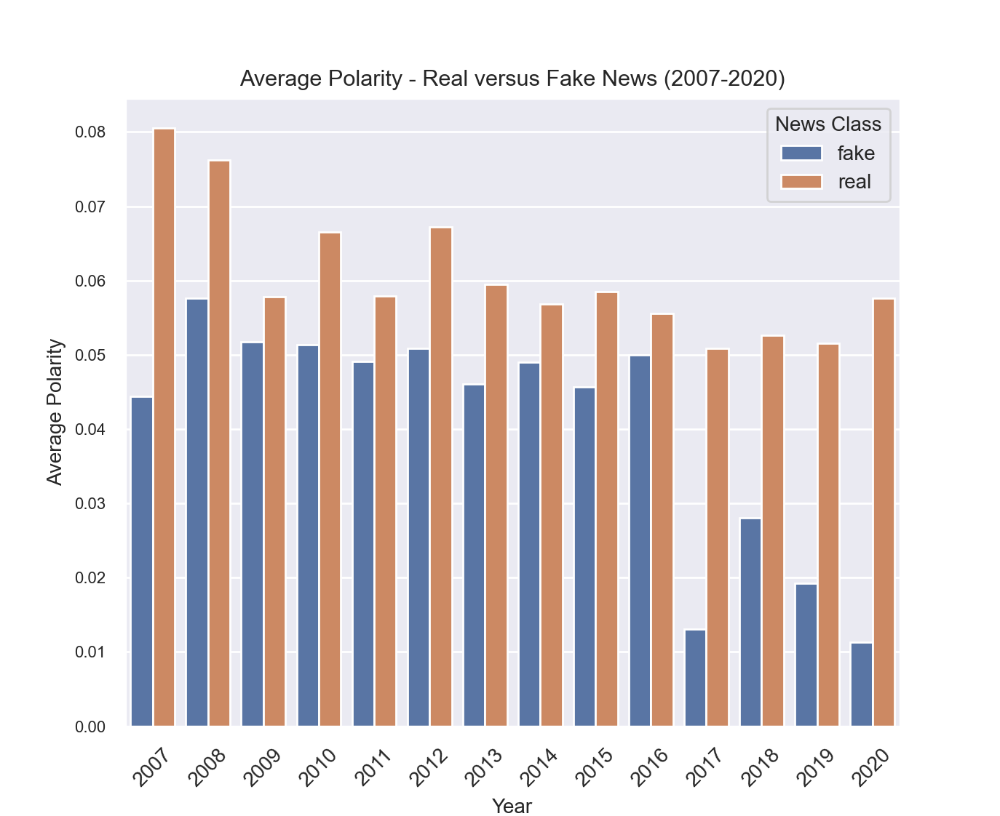

In [302]:
ax=sns.barplot(x='year',y='polarity',hue='label_fnn', data=sentiment_year )
ax.set_title('Average Polarity - Real versus Fake News (2007-2020)',fontsize=11)
ax.yaxis.set_tick_params(labelsize=8)
ax.xaxis.set_tick_params(labelsize=10)
ax.legend(title='News Class', title_fontsize=10, prop=dict(size=10))
ax.set_xlabel('Year', fontsize=10)
ax.tick_params(axis='x', labelrotation=45)
ax.set_ylabel('Average Polarity',fontsize=10);

In [188]:
# emotions over time
emotion_year = fnid.groupby(['label_fnn', 'year'])[['Happy', 'Angry', 'Surprise', 'Sad', 'Fear']].mean().reset_index()
emotion_year.head()

,label_fnn,year,Happy,Angry,Surprise,Sad,Fear
0,fake,2007,0.080714,0.046571,0.277714,0.171571,0.424429
1,fake,2008,0.086709,0.033675,0.262137,0.176282,0.441667
2,fake,2009,0.074028,0.033611,0.274259,0.150602,0.467454
3,fake,2010,0.070131,0.033077,0.261335,0.182888,0.452206
4,fake,2011,0.069193,0.035170,0.268585,0.184058,0.442889


<IPython.core.display.Javascript object>


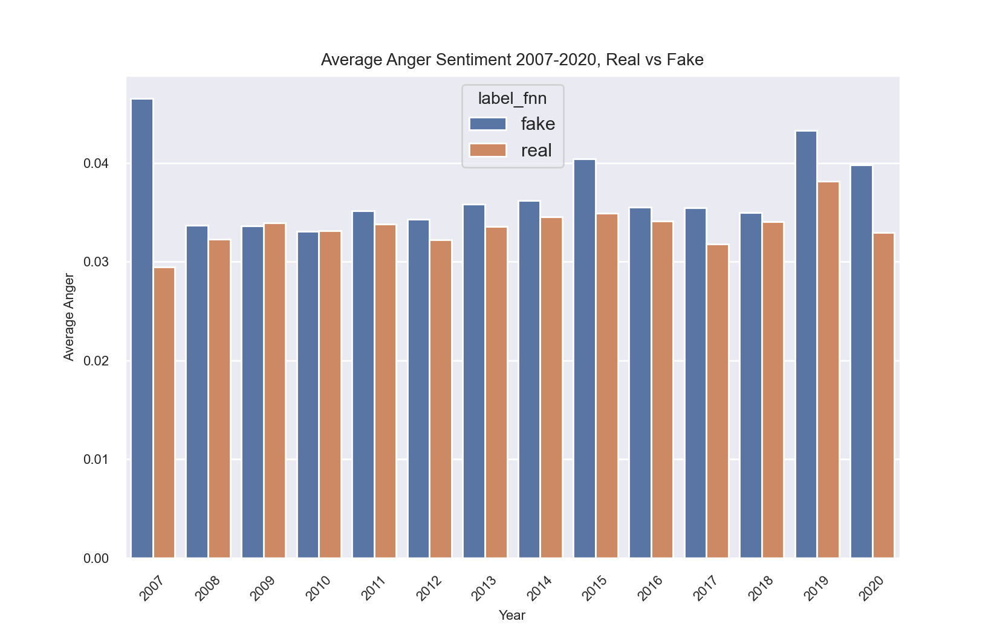

In [189]:
# average anger by year 
ax=sns.barplot(x='year',y='Angry',hue='label_fnn', data=emotion_year )
ax.set_title('Average Anger Sentiment 2007-2020, Real vs Fake',fontsize=10)
ax.yaxis.set_tick_params(labelsize=8)
ax.xaxis.set_tick_params(labelsize=8)
ax.set_xlabel('Year', fontsize=8)
ax.tick_params(axis='x', labelrotation=45)
ax.set_ylabel('Average Anger',fontsize=8);

<IPython.core.display.Javascript object>


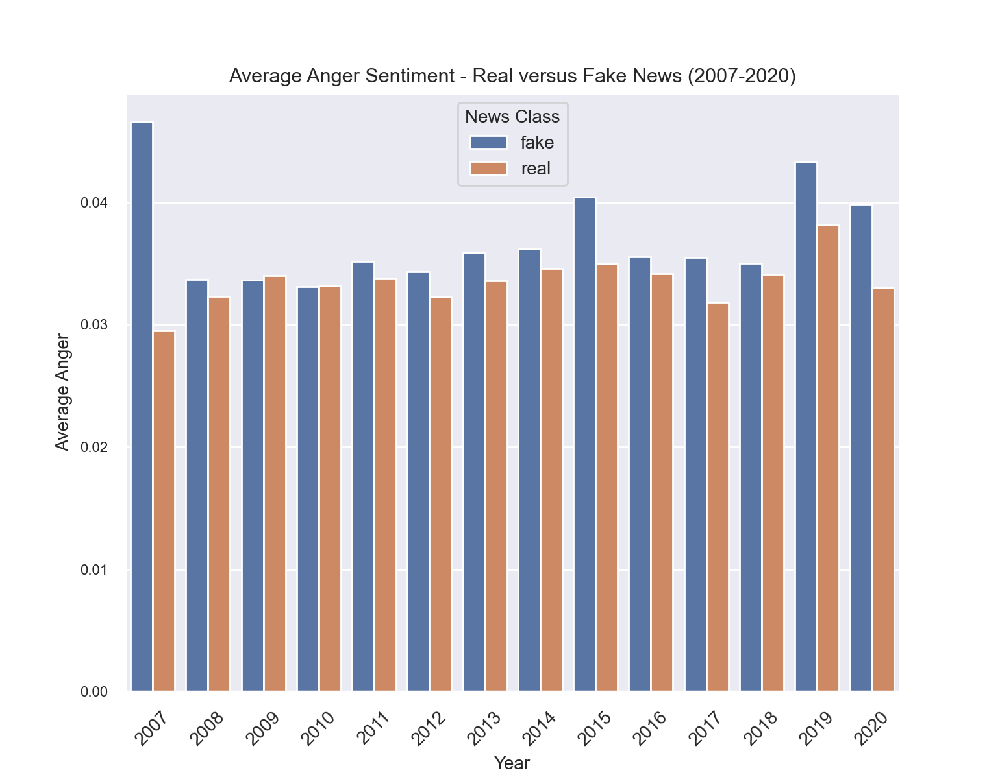

In [303]:
ax=sns.barplot(x='year',y='Angry',hue='label_fnn', data=emotion_year  )
ax.set_title('Average Anger Sentiment - Real versus Fake News (2007-2020)',fontsize=11)
ax.yaxis.set_tick_params(labelsize=8)
ax.xaxis.set_tick_params(labelsize=10)
ax.legend(title='News Class', title_fontsize=10, prop=dict(size=10))
ax.set_xlabel('Year', fontsize=10)
ax.tick_params(axis='x', labelrotation=45)
ax.set_ylabel('Average Anger',fontsize=10);

<IPython.core.display.Javascript object>


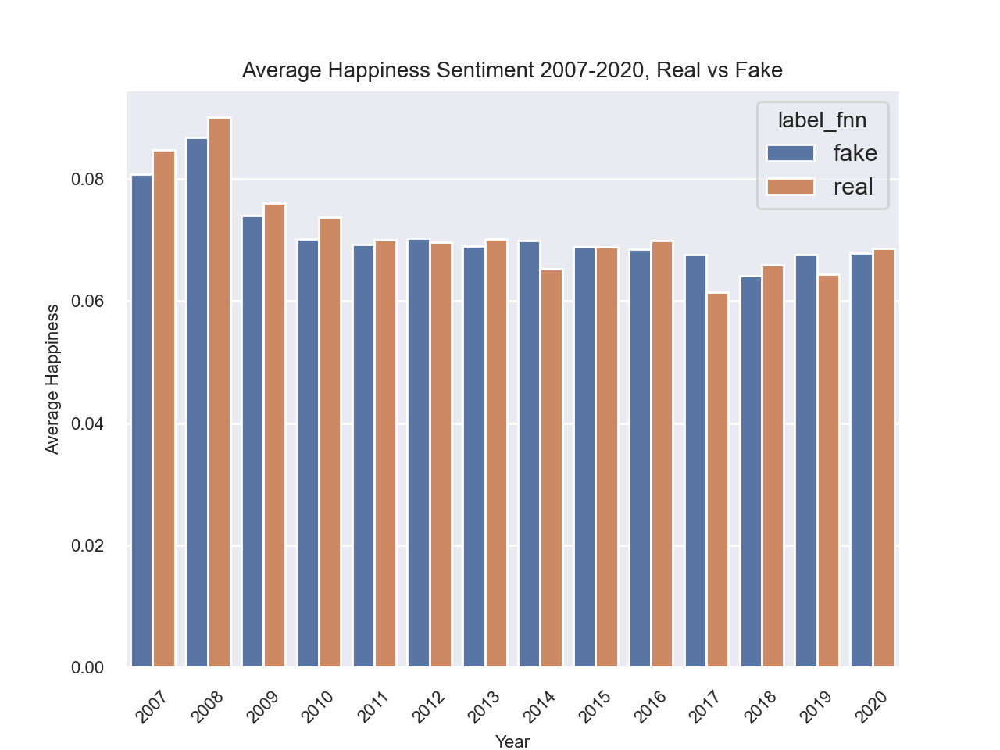

In [192]:
# average happy by year 
ax=sns.barplot(x='year',y='Happy',hue='label_fnn', data=emotion_year )
ax.set_title('Average Happiness Sentiment 2007-2020, Real vs Fake',fontsize=10)
ax.yaxis.set_tick_params(labelsize=8)
ax.xaxis.set_tick_params(labelsize=8)
ax.set_xlabel('Year', fontsize=8)
ax.tick_params(axis='x', labelrotation=45)
ax.set_ylabel('Average Happiness',fontsize=8);

<IPython.core.display.Javascript object>


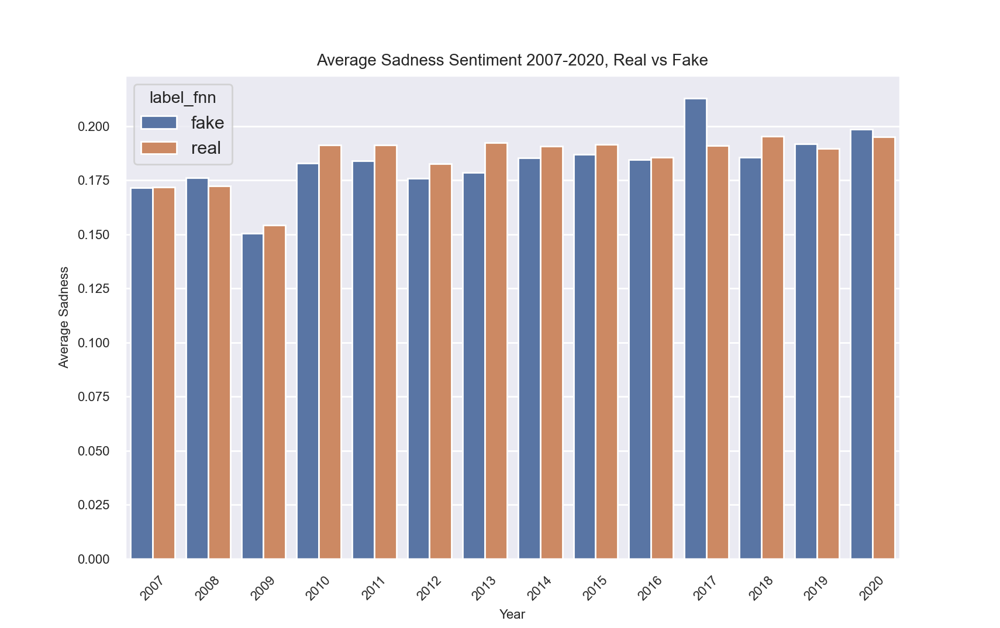

In [190]:
# average sadness by year 
ax=sns.barplot(x='year',y='Sad',hue='label_fnn', data=emotion_year )
ax.set_title('Average Sadness Sentiment 2007-2020, Real vs Fake',fontsize=10)
ax.yaxis.set_tick_params(labelsize=8)
ax.xaxis.set_tick_params(labelsize=8)
ax.set_xlabel('Year', fontsize=8)
ax.tick_params(axis='x', labelrotation=45)
ax.set_ylabel('Average Sadness',fontsize=8);

<IPython.core.display.Javascript object>


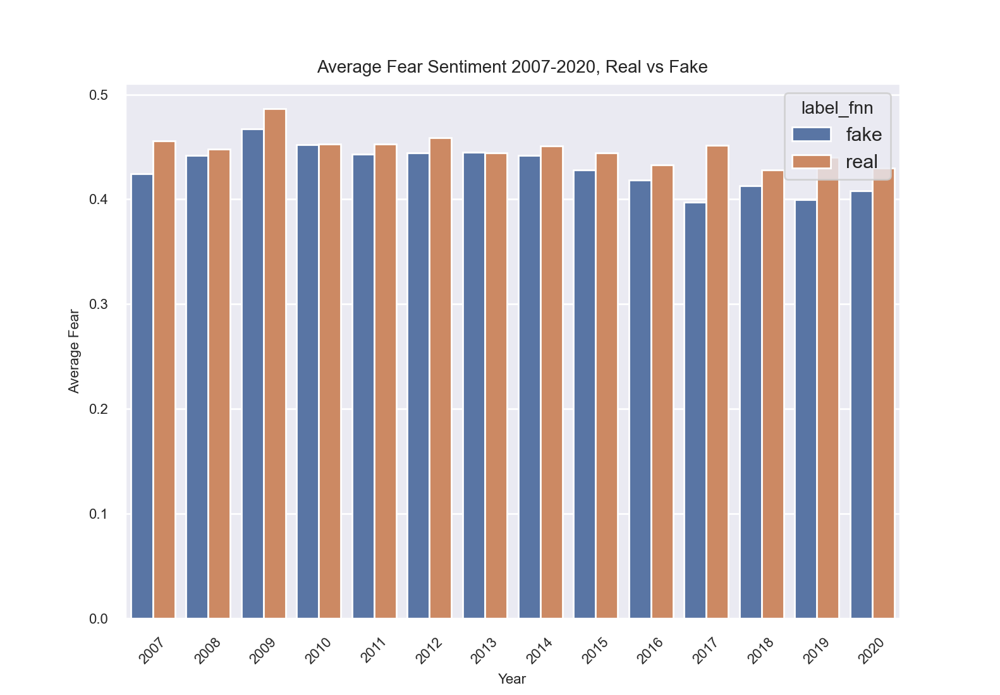

In [191]:
# average fear by year 
ax=sns.barplot(x='year',y='Fear',hue='label_fnn', data=emotion_year )
ax.set_title('Average Fear Sentiment 2007-2020, Real vs Fake',fontsize=10)
ax.yaxis.set_tick_params(labelsize=8)
ax.xaxis.set_tick_params(labelsize=8)
ax.set_xlabel('Year', fontsize=8)
ax.tick_params(axis='x', labelrotation=45)
ax.set_ylabel('Average Fear',fontsize=8);